In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

In [2]:
import tensorflow as tf

In [4]:
pip install pygame

     |████████████████████████████████| 11.5MB 347kB/s 


In [5]:
from pygame import mixer

pygame 2.0.0 (SDL 2.0.12, python 3.6.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [23]:
#malheureusement on a un probléme d'initialiser 'mixer' donc on annule la partie d'alarme

In [6]:
from keras.models import load_model

In [7]:
import time

In [25]:
face = cv2.CascadeClassifier('/content/haarcascade_frontalface_alt.xml')
leye = cv2.CascadeClassifier('/content/haarcascade_lefteye_2splits.xml')
reye = cv2.CascadeClassifier('/content/haarcascade_righteye_2splits.xml')

In [14]:
label = ['Close','Open']

In [16]:
model = load_model('/content/cnnCat2.h5')

In [20]:
path = os.getcwd()
cap = cv2.VideoCapture('/content/vid.mp4')
font = cv2.FONT_HERSHEY_COMPLEX_SMALL
count=0
score=0
thicc=2
rpred=[99]
lpred=[99]

In [21]:
#le code suivant est mis dans un boucle while danc il doit etre dans le méme cellule

In [22]:
from google.colab.patches import cv2_imshow

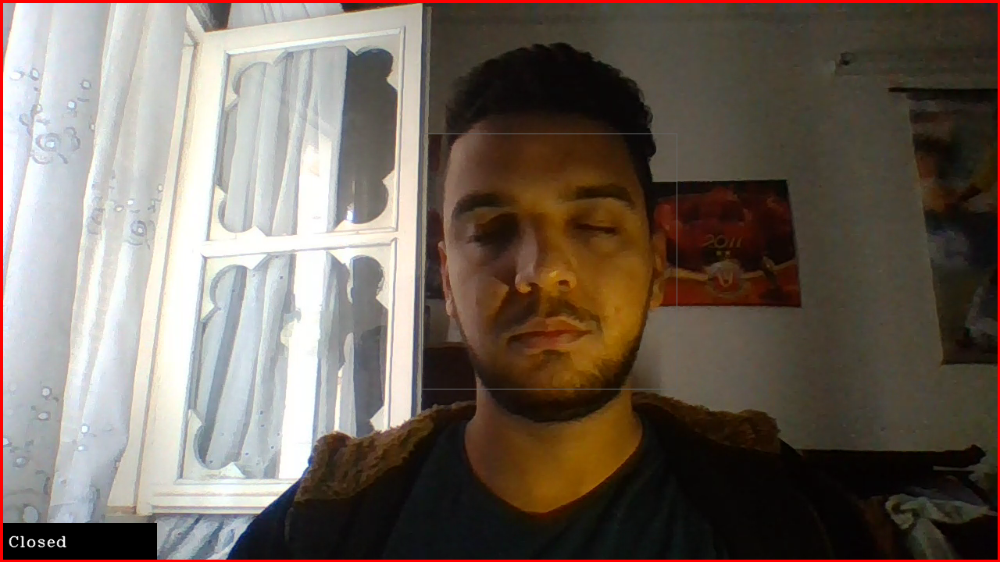

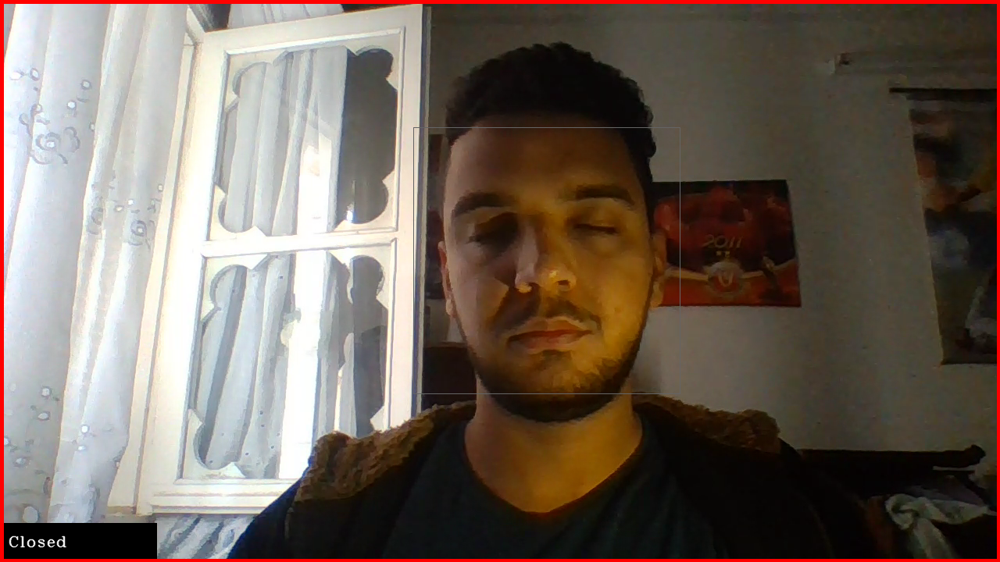

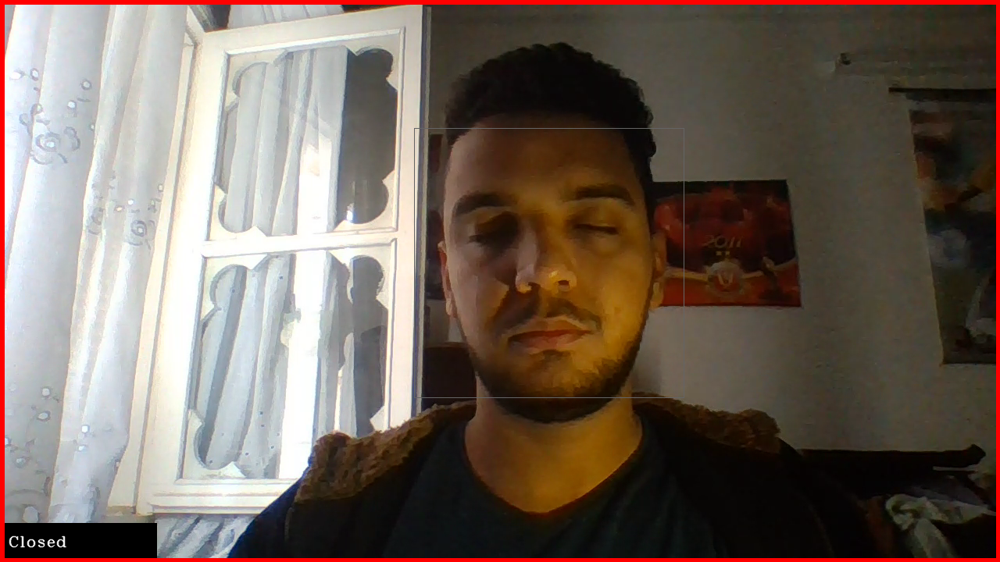

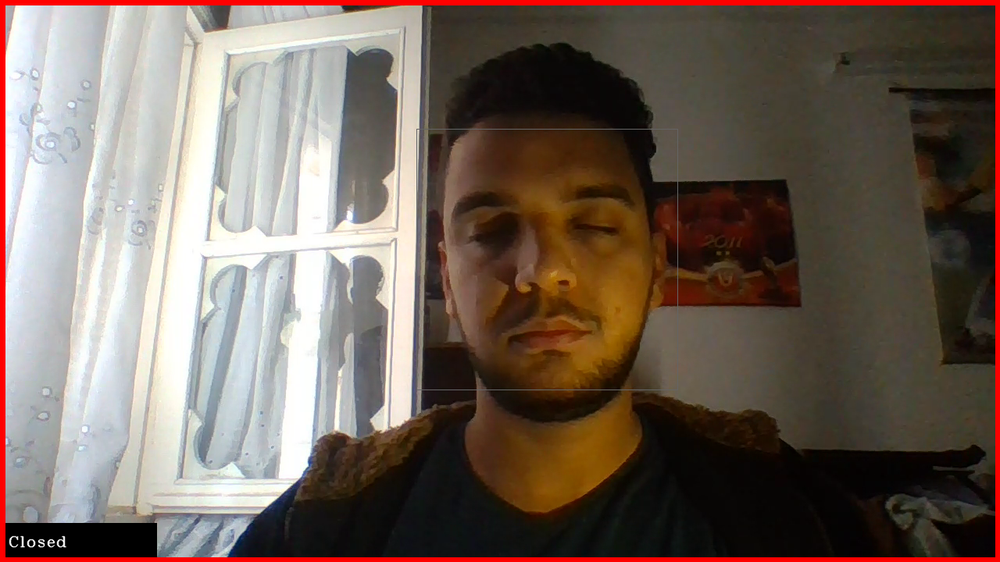

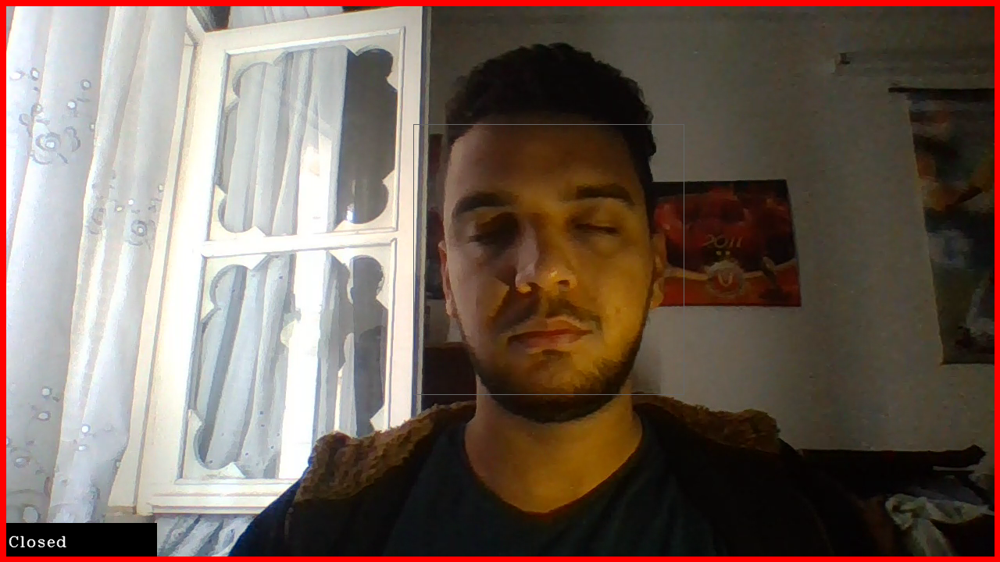

...

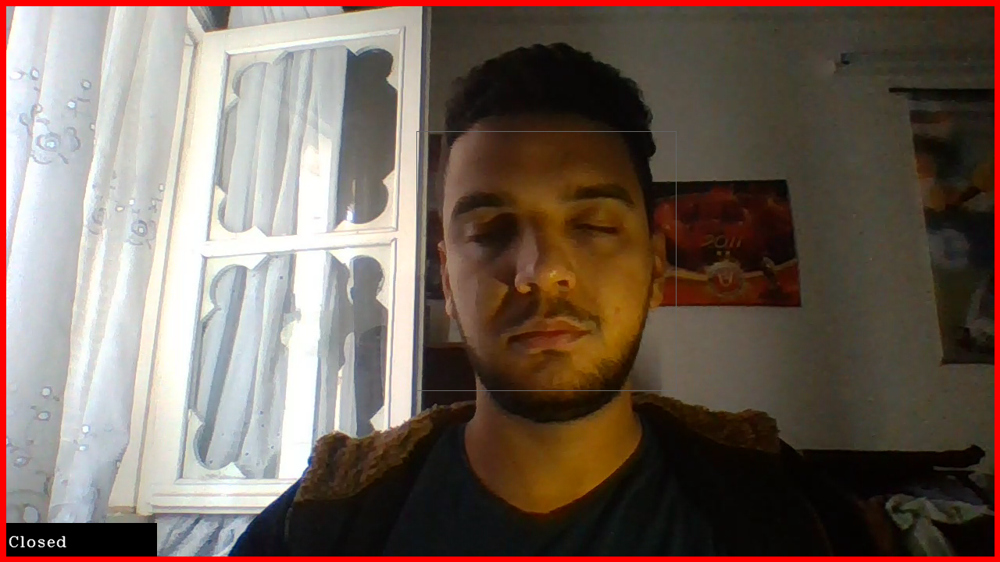

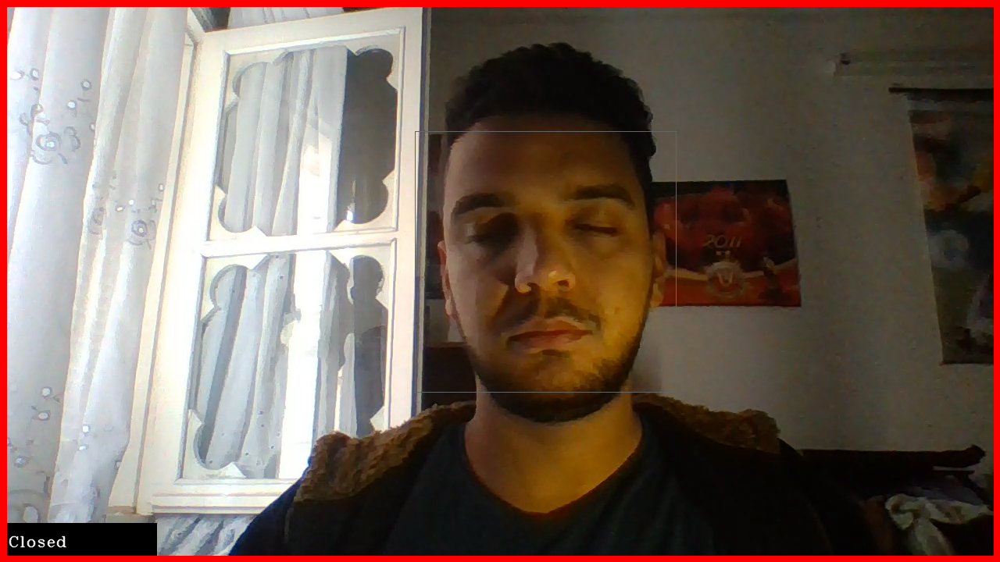

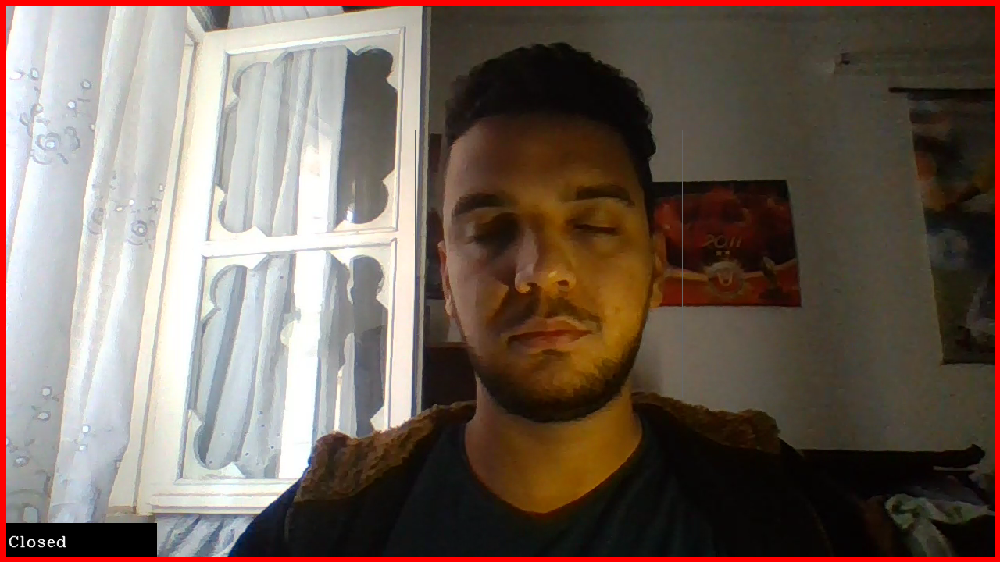

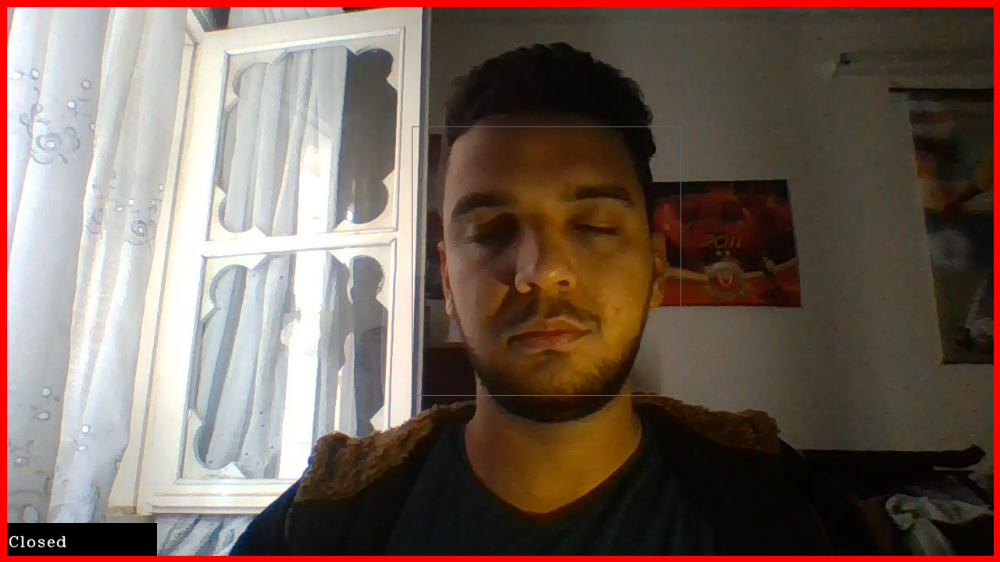

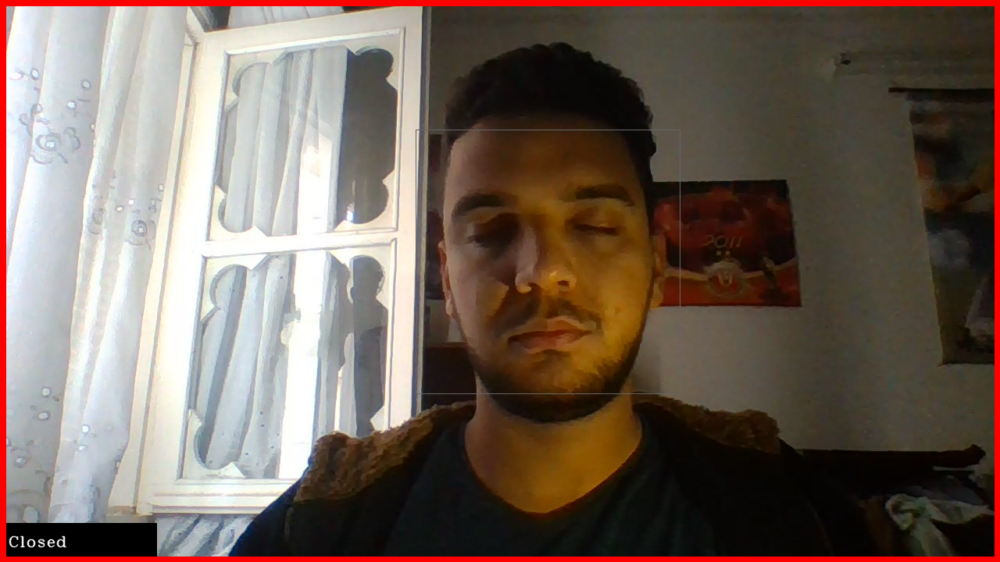

In [ ]:
while(True):
  #on prend image par image
  ret, frame = cap.read()
  height,width = frame.shape[:2]
  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  #on détécte le visage et les 2 yeux
  faces = face.detectMultiScale(gray,minNeighbors=5,scaleFactor=1.1,minSize=(25,25))
  left_eye = leye.detectMultiScale(gray)
  right_eye = reye.detectMultiScale(gray)
  #on trace un rectangle autour du visage
  cv2.rectangle(frame, (0,height-50) , (200,height) , (0,0,0) , thickness=cv2.FILLED )
  for (x,y,w,h) in faces:
    cv2.rectangle(frame, (x,y) , (x+w,y+h) , (100,100,100) , 1 )
    #on travaille sur l'oeil a droite
    for (x,y,w,h) in right_eye:
      r_eye=frame[y:y+h,x:x+w]
      count=count+1
      r_eye = cv2.cvtColor(r_eye,cv2.COLOR_BGR2GRAY)
      r_eye = cv2.resize(r_eye,(24,24))
      r_eye= r_eye/255
      r_eye= r_eye.reshape(24,24,-1)
      r_eye = np.expand_dims(r_eye,axis=0)
      rpred = model.predict_classes(r_eye)
      if(rpred[0]==1):
        label='Open'
      if(rpred[0]==0):
        label='Closed'
        break
    #on travaille sur l'oeil a gauche
    for (x,y,w,h) in left_eye:
      l_eye=frame[y:y+h,x:x+w]
      count=count+1
      l_eye = cv2.cvtColor(l_eye,cv2.COLOR_BGR2GRAY)
      l_eye = cv2.resize(l_eye,(24,24))
      l_eye= l_eye/255
      l_eye=l_eye.reshape(24,24,-1)
      l_eye = np.expand_dims(l_eye,axis=0)
      lpred = model.predict_classes(l_eye)
      if(lpred[0]==1):
        label='Open'
      if(lpred[0]==0):
        label='Closed'
        break

    if(rpred[0]==0 and lpred[0]==0):
      score=score+1
      cv2.putText(frame,"Closed",(10,height-20), font, 1,(255,255,255),1,cv2.LINE_AA)
    # if(rpred[0]==1 or lpred[0]==1):
    else:
        score=score-1
        cv2.putText(frame,"Open",(10,height-20), font, 1,(255,255,255),1,cv2.LINE_AA)

    if(score<0):
      score=0
      cv2.putText(frame,'Score:'+str(score),(100,height-20), font, 1,(255,255,255),1,cv2.LINE_AA)

    if(score>15):
      #le personne est dormis donc on doit clancher l'alarme
      cv2.imwrite(os.path.join(path,'image.jpg'),frame)

      if(thicc<16):
        thicc= thicc+2
      else:
        thicc=thicc-2
        if(thicc<2):
          thicc=2
      cv2.rectangle(frame,(0,0),(width,height),(0,0,255),thicc)
      cv2_imshow(frame)
      if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()